In [1]:
import numpy as np
import pandas as pd
import random

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import itertools

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

import eli5
from eli5.sklearn import PermutationImportance
import shap
shap.initjs()

%matplotlib inline

import warnings

warnings.filterwarnings("ignore")

In [2]:
heart_df = pd.read_csv("heart_disease_uci.csv")

### Data description

In [3]:
heart_df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


In [4]:
heart_df.shape

(920, 16)

In [5]:
heart_df.describe()

,id,age,trestbps,chol,thalch,oldpeak,ca,num
count,920.000000,920.000000,861.000000,890.000000,865.000000,858.000000,309.000000,920.000000
mean,460.500000,53.510870,132.132404,199.130337,137.545665,0.878788,0.676375,0.995652
std,265.725422,9.424685,19.066070,110.780810,25.926276,1.091226,0.935653,1.142693
min,1.000000,28.000000,0.000000,0.000000,60.000000,-2.600000,0.000000,0.000000
25%,230.750000,47.000000,120.000000,175.000000,120.000000,0.000000,0.000000,0.000000
50%,460.500000,54.000000,130.000000,223.000000,140.000000,0.500000,0.000000,1.000000
75%,690.250000,60.000000,140.000000,268.000000,157.000000,1.500000,1.000000,2.000000
max,920.000000,77.000000,200.000000,603.000000,202.000000,6.200000,3.000000,4.000000


In [6]:
heart_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        920 non-null    int64  
 1   age       920 non-null    int64  
 2   sex       920 non-null    object 
 3   dataset   920 non-null    object 
 4   cp        920 non-null    object 
 5   trestbps  861 non-null    float64
 6   chol      890 non-null    float64
 7   fbs       830 non-null    object 
 8   restecg   918 non-null    object 
 9   thalch    865 non-null    float64
 10  exang     865 non-null    object 
 11  oldpeak   858 non-null    float64
 12  slope     611 non-null    object 
 13  ca        309 non-null    float64
 14  thal      434 non-null    object 
 15  num       920 non-null    int64  
dtypes: float64(5), int64(3), object(8)
memory usage: 115.1+ KB


## Data preprocessing

### Handling Missing Data:

In [7]:
data = heart_df.copy()

In [8]:
data.dropna(inplace=True)
data = shuffle(data)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 299 entries, 142 to 152
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        299 non-null    int64  
 1   age       299 non-null    int64  
 2   sex       299 non-null    object 
 3   dataset   299 non-null    object 
 4   cp        299 non-null    object 
 5   trestbps  299 non-null    float64
 6   chol      299 non-null    float64
 7   fbs       299 non-null    object 
 8   restecg   299 non-null    object 
 9   thalch    299 non-null    float64
 10  exang     299 non-null    object 
 11  oldpeak   299 non-null    float64
 12  slope     299 non-null    object 
 13  ca        299 non-null    float64
 14  thal      299 non-null    object 
 15  num       299 non-null    int64  
dtypes: float64(5), int64(3), object(8)
memory usage: 39.7+ KB


## 1.Exploratory Data Analysis

- ### 1.1 Age distribution

In [9]:
fig = go.Figure()
fig.add_trace(
    go.Box(y=data['age'].values,
           name='Age',
           marker_color='green',
           boxmean=True))
fig.add_trace(
    go.Box(y=data[data['sex'] == 'Male']['age'].values,
           name='Male only',
           marker_color='blue',
           boxmean=True))
fig.add_trace(
    go.Box(y=data[data['sex'] == 'Female']['age'].values,
           name='Female only',
           marker_color='red',
           boxmean=True))
fig.update_layout(title='Age Distribution(all)',
                  yaxis_title='Age',
                  title_x=0.5)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.show()

the histogram of the ages

In [10]:
group_labels = ['Age Distribution']
fig = ff.create_distplot([data.age], group_labels)
fig.update_layout(title='Age Distribution(all)',
                  yaxis_title='propotion',
                  xaxis_title='Age',
                  title_x=0.5)
fig.show()



- ### 1.2 Male and Female propotion

In [11]:
df = data['sex'].value_counts().reset_index().rename(columns={
    'index': 'sex',
    'sex': 'count'
})
fig = go.Figure(
    [go.Pie(labels=['Male', 'Female'], values=df['count'], hole=0.5)])
fig.update_traces(hoverinfo='label+percent',
                  textinfo='value+percent',
                  textfont_size=15,
                  insidetextorientation='radial')
fig.update_layout(title="Male to Female ratio in the study", title_x=0.5)
fig.show()

- ### 1.3 Dataset Contributors

In [12]:
df = data['dataset'].value_counts().reset_index().rename(columns={
    'index': 'dataset',
    'dataset': 'count'
})
fig = go.Figure([go.Pie(labels=df['dataset'], values=df['count'], hole=0.5)])
fig.update_traces(hoverinfo='label+percent',
                  textinfo='value+percent',
                  textfont_size=15,
                  insidetextorientation='radial')
fig.update_layout(title="Dataset Contributors", title_x=0.5)
fig.show()

- ### 1.3 Chest Pain Type Propotions

In [13]:
df = data['cp'].value_counts().reset_index().rename(columns={
    'index': 'cp',
    'cp': 'count'
})
fig = go.Figure([go.Pie(labels=df['cp'], values=df['count'], hole=0.5)])
fig.update_traces(hoverinfo='label+percent',
                  textinfo='value+percent',
                  textfont_size=15,
                  insidetextorientation='radial')
fig.update_layout(title="Chest Pain Conditions", title_x=0.5)
fig.show()

- ### 1.4 Resting Blood Pressure vs Gender:

In [14]:
fig = go.Figure()
fig.add_trace(
    go.Box(y=data['trestbps'].values,
           name='BP at Rest for all',
           marker_color='green',
           boxmean=True))
fig.add_trace(
    go.Box(y=data[data['sex'] == 'Male']['trestbps'].values,
           name='Male only',
           marker_color='blue',
           boxmean=True))
fig.add_trace(
    go.Box(y=data[data['sex'] == 'Female']['trestbps'].values,
           name='Female only',
           marker_color='red',
           boxmean=True))
fig.update_layout(title='BP Distribution',
                  yaxis_title='Blood Pressure (mm/Hg)',
                  title_x=0.5)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.show()

- ### 1.5 Resting Blood Prssure vs Disease

In [15]:
fig = go.Figure()
fig.add_trace(
    go.Box(y=data['trestbps'].values,
           name='BP at Rest for all',
           marker_color='green',
           boxmean=True))
fig.add_trace(
    go.Box(y=data[data['num'] == 0]['trestbps'].values,
           name='No Disease',
           marker_color='blue',
           boxmean=True))
fig.add_trace(
    go.Box(y=data[data['num'] != 0]['trestbps'].values,
           name='Heart Disease',
           marker_color='red',
           boxmean=True))
fig.update_layout(title='BP Distribution (at rest)',
                  yaxis_title='Blood Pressure (mm/Hg)',
                  title_x=0.5)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.show()

- ### 1.6 Cholesterol Level Distribution

In [16]:
fig = go.Figure()
fig.add_trace(
    go.Violin(y=data['chol'].values, name='All Patient', marker_color='green'))
fig.add_trace(
    go.Violin(y=data[data['num'] == 0]['chol'].values,
              name='No Disease',
              marker_color='blue'))
fig.add_trace(
    go.Violin(y=data[data['num'] == 4]['chol'].values,
              name='Heart Disease',
              marker_color='red'))
fig.update_layout(title='Cholesterol Level Distribution',
                  yaxis_title='Cholesterol Level',
                  title_x=0.5)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.show()

- ### 1.7 Correlation matrix

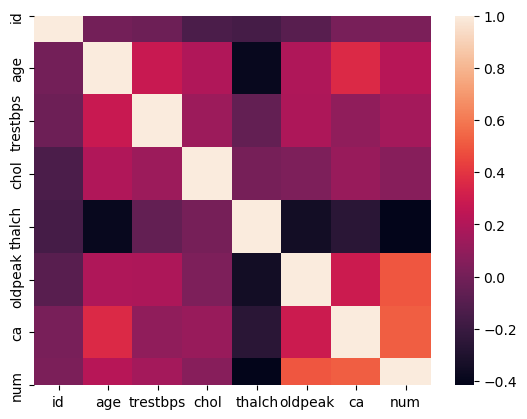

In [17]:
corr = data.corr()

sns.heatmap(corr)
plt.show()

## 2.Data processing

In [18]:
heart_df.dtypes

id            int64
age           int64
sex          object
dataset      object
cp           object
trestbps    float64
chol        float64
fbs          object
restecg      object
thalch      float64
exang        object
oldpeak     float64
slope        object
ca          float64
thal         object
num           int64
dtype: object

In [19]:
data = data.drop('id', axis=1)
data = data.drop('dataset', axis=1)
data.columns = [
    'age', 'sex', 'chest_pain_type', 'resting_blood_pressure', 'cholesterol',
    'fasting_blood_sugar', 'rest_ecg', 'max_heart_rate',
    'exercise_induced_angina', 'st_depression', 'st_slop', 'num_major_vessels',
    'thalassemia', 'target'
]

- ### 2.1 Agreggate target column

In [20]:
data['target'] = ((data['target'] > 0)*1).copy()

In [21]:
data.head()

,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,rest_ecg,max_heart_rate,exercise_induced_angina,st_depression,st_slop,num_major_vessels,thalassemia,target
142,52,Male,atypical angina,128.0,205.0,True,normal,184.0,False,0.0,upsloping,0.0,normal,0
235,54,Male,asymptomatic,122.0,286.0,False,lv hypertrophy,116.0,True,3.2,flat,2.0,normal,1
234,54,Female,non-anginal,160.0,201.0,False,normal,163.0,False,0.0,upsloping,1.0,normal,0
171,53,Male,asymptomatic,142.0,226.0,False,lv hypertrophy,111.0,True,0.0,upsloping,0.0,reversable defect,0
267,59,Male,non-anginal,126.0,218.0,True,normal,134.0,False,2.2,flat,1.0,fixed defect,1


- ### 2.2 One-hot encoding

In [22]:
data = pd.get_dummies(data)

In [23]:
len(data.columns)

26

In [24]:
data

,age,resting_blood_pressure,cholesterol,max_heart_rate,st_depression,num_major_vessels,target,sex_Female,sex_Male,chest_pain_type_asymptomatic,...,rest_ecg_normal,rest_ecg_st-t abnormality,exercise_induced_angina_False,exercise_induced_angina_True,st_slop_downsloping,st_slop_flat,st_slop_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect
142,52,128.0,205.0,184.0,0.0,0.0,0,0,1,0,...,1,0,1,0,0,0,1,0,1,0
235,54,122.0,286.0,116.0,3.2,2.0,1,0,1,1,...,0,0,0,1,0,1,0,0,1,0
234,54,160.0,201.0,163.0,0.0,1.0,0,1,0,0,...,1,0,1,0,0,0,1,0,1,0
171,53,142.0,226.0,111.0,0.0,0.0,0,0,1,1,...,0,0,0,1,0,0,1,0,0,1
267,59,126.0,218.0,134.0,2.2,1.0,1,0,1,0,...,1,0,1,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,55,140.0,217.0,111.0,5.6,0.0,1,0,1,1,...,1,0,0,1,1,0,0,0,0,1
175,57,152.0,274.0,88.0,1.2,1.0,1,0,1,1,...,1,0,0,1,0,1,0,0,0,1
49,53,130.0,197.0,152.0,1.2,0.0,0,0,1,0,...,0,0,1,0,1,0,0,0,1,0
297,57,140.0,241.0,123.0,0.2,0.0,1,1,0,1,...,1,0,0,1,0,1,0,0,0,1


- ### 2.3 Separate features and target

In [25]:
X = data.drop('target',axis=1)

In [26]:
X

,age,resting_blood_pressure,cholesterol,max_heart_rate,st_depression,num_major_vessels,sex_Female,sex_Male,chest_pain_type_asymptomatic,chest_pain_type_atypical angina,...,rest_ecg_normal,rest_ecg_st-t abnormality,exercise_induced_angina_False,exercise_induced_angina_True,st_slop_downsloping,st_slop_flat,st_slop_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect
142,52,128.0,205.0,184.0,0.0,0.0,0,1,0,1,...,1,0,1,0,0,0,1,0,1,0
235,54,122.0,286.0,116.0,3.2,2.0,0,1,1,0,...,0,0,0,1,0,1,0,0,1,0
234,54,160.0,201.0,163.0,0.0,1.0,1,0,0,0,...,1,0,1,0,0,0,1,0,1,0
171,53,142.0,226.0,111.0,0.0,0.0,0,1,1,0,...,0,0,0,1,0,0,1,0,0,1
267,59,126.0,218.0,134.0,2.2,1.0,0,1,0,0,...,1,0,1,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,55,140.0,217.0,111.0,5.6,0.0,0,1,1,0,...,1,0,0,1,1,0,0,0,0,1
175,57,152.0,274.0,88.0,1.2,1.0,0,1,1,0,...,1,0,0,1,0,1,0,0,0,1
49,53,130.0,197.0,152.0,1.2,0.0,0,1,0,0,...,0,0,1,0,1,0,0,0,1,0
297,57,140.0,241.0,123.0,0.2,0.0,1,0,1,0,...,1,0,0,1,0,1,0,0,0,1


In [27]:
y = data['target']

In [28]:
y

142    0
235    1
234    0
171    0
267    1
      ..
123    1
175    1
49     0
297    1
152    0
Name: target, Length: 299, dtype: int64

 - ### 2.4 Seperate train data and test data

In [29]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=10)

In [30]:
X_train.shape

(239, 25)

## 3.Build the model

In [31]:
params = [{
    'max_depth': range(3, 10),
    'n_estimators': range(10, 100, 1)
}]

gs_random_forest = GridSearchCV(RandomForestClassifier(), param_grid=params, scoring='recall', cv=10)
gs_random_forest.fit(X_train, y_train)
print(gs_random_forest.best_score_)
print(gs_random_forest.best_params_)
best_max_depth = gs_random_forest.best_params_['max_depth']
best_n_estimators = gs_random_forest.best_params_['n_estimators']

model = RandomForestClassifier(max_depth=best_max_depth,
                               n_estimators=best_n_estimators,
                               random_state=5)
model.fit(X_train, y_train)

0.8272727272727274
{'max_depth': 5, 'n_estimators': 49}


RandomForestClassifier(max_depth=5, n_estimators=49, random_state=5)

In [32]:
len(model.estimators_)

49

- ### 3.1 Visualize the tree

In [33]:
random_tree_number = random.randint(0,best_n_estimators)
print('random_tree_number:',random_tree_number)
random_tree = model.estimators_[random_tree_number]

random_tree_number: 11


In [34]:
feature_names = X_train.columns
y_train_str = y_train.astype('str')
y_train_str[y_train_str=='0'] = 'no disease'
y_train_str[y_train_str=='1'] = 'disease'
y_train_str = y_train_str.values

In [35]:
from sklearn.tree import export_graphviz

export_graphviz(random_tree,
                out_file='tree.dot',
                feature_names=feature_names,
                class_names=y_train_str,
                rounded=True,
                proportion=True,
                label='root',
                precision=2,
                filled=True)
from subprocess import call

call(['dot','-Tpng','tree.dot','-o','tree.png','-Gdpi=600'])

from IPython.display import Image
Image(filename='tree.png')

import graphviz
dot_data = tree.export_graphviz(model, out_file=None)
graph = graphviz.Source(dot_data)
graph.render("heart_disease_prediction")

dot_data = tree.export_graphviz(model, out_file=None,
                     feature_names=x_data.columns,
                     class_names=x_data.columns,
                     filled=True, rounded=True,
                     special_characters=True)
graph = graphviz.Source(dot_data)
graph.view()

In [36]:
eli5.show_weights(random_tree,feature_names=feature_names.tolist())

Weight,Feature
0.4159,max_heart_rate
0.1324,thalassemia_normal
0.0956,cholesterol
0.0918,age
0.0516,st_depression
0.0455,thalassemia_reversable defect
0.0384,num_major_vessels
0.0305,chest_pain_type_atypical angina
0.0289,resting_blood_pressure
0.0208,rest_ecg_normal


In [37]:
random_tree.feature_importances_

array([0.09181784, 0.02891017, 0.09557337, 0.41594162, 0.05159525,
       0.03843445, 0.01939193, 0.        , 0.        , 0.03053074,
       0.01696794, 0.        , 0.        , 0.        , 0.        ,
       0.02077706, 0.        , 0.        , 0.00727197, 0.        ,
       0.00348643, 0.00139846, 0.        , 0.13238561, 0.04551716])

In [38]:
feature_names = X_test.columns
feature_importances = random_tree.feature_importances_
indices = np.argsort(feature_importances)[::-1]

for index in indices:
    print("feature %s [%f]"%(feature_names[index],feature_importances[index]))

feature max_heart_rate [0.415942]
feature thalassemia_normal [0.132386]
feature cholesterol [0.095573]
feature age [0.091818]
feature st_depression [0.051595]
feature thalassemia_reversable defect [0.045517]
feature num_major_vessels [0.038434]
feature chest_pain_type_atypical angina [0.030531]
feature resting_blood_pressure [0.028910]
feature rest_ecg_normal [0.020777]
feature sex_Female [0.019392]
feature chest_pain_type_non-anginal [0.016968]
feature exercise_induced_angina_True [0.007272]
feature st_slop_flat [0.003486]
feature st_slop_upsloping [0.001398]
feature chest_pain_type_typical angina [0.000000]
feature st_slop_downsloping [0.000000]
feature exercise_induced_angina_False [0.000000]
feature chest_pain_type_asymptomatic [0.000000]
feature sex_Male [0.000000]
feature fasting_blood_sugar_True [0.000000]
feature rest_ecg_lv hypertrophy [0.000000]
feature thalassemia_fixed defect [0.000000]
feature rest_ecg_st-t abnormality [0.000000]
feature fasting_blood_sugar_False [0.000000

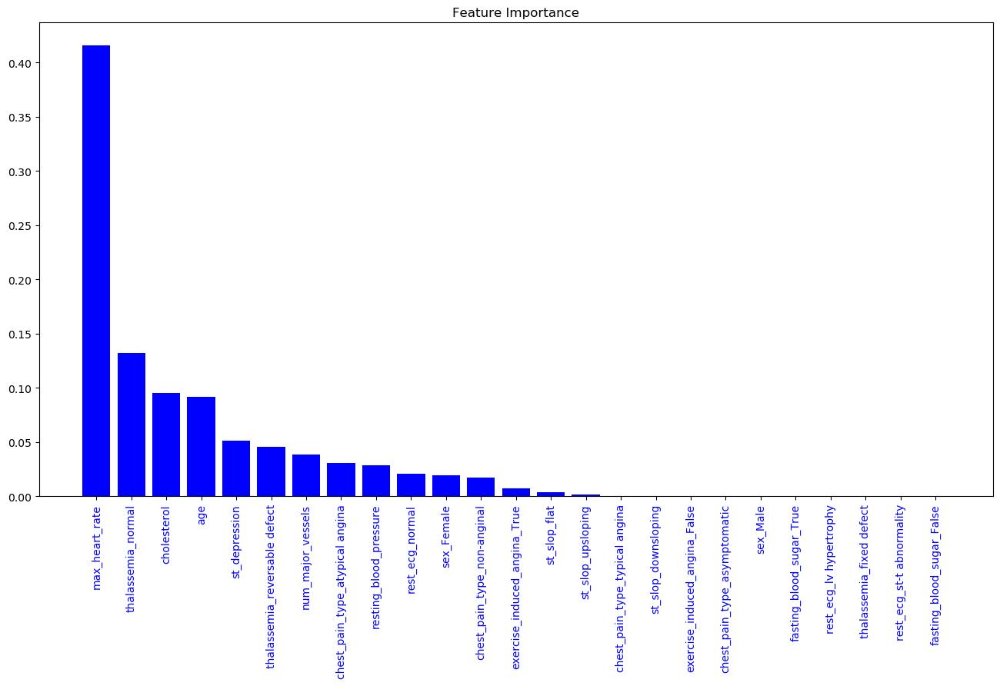

In [39]:
plt.figure(figsize=(16, 8))
plt.title('Feature Importance')
plt.bar(range(len(feature_importances)),
        feature_importances[indices],
        color='b')
plt.xticks(range(len(feature_importances)),
           np.array(feature_names)[indices],
           color='b',
           rotation=90)
plt.show() 

## 4.Model evaluation

- ### 4.1 get a test sample

In [40]:
random_test_sample_number = random.randint(0,X_test.shape[0])

In [41]:
test_sample = X_test.iloc[random_test_sample_number]

In [42]:
test_sample.shape

(25,)

In [43]:
test_sample = np.array(test_sample).reshape(1,-1)

In [44]:
test_sample

array([[ 58. , 112. , 230. , 165. ,   2.5,   1. ,   0. ,   1. ,   0. ,
          0. ,   1. ,   0. ,   1. ,   0. ,   1. ,   0. ,   0. ,   1. ,
          0. ,   0. ,   1. ,   0. ,   0. ,   0. ,   1. ]])

In [45]:
test_sample.shape

(1, 25)

- ### 4.2 Predict 1 test sample

In [46]:
model.predict(test_sample)

array([1])

In [47]:
model.predict_proba(test_sample)

array([[0.36849539, 0.63150461]])

In [48]:
y_pred = model.predict(X_test)

- ### 4.3 Confusion matrix

In [49]:
confusion_matrix_model = confusion_matrix(y_test,y_pred)

In [50]:
confusion_matrix_model

array([[22,  4],
       [ 8, 26]])

In [51]:
def cnf_matrix_plotter(cm, classes):
    plt.imshow(cm, interpolation='nearest', cmap='summer')
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    threshold = cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j,
                 i,
                 cm[i, j],
                 horizontalalignment='center',
                 color='orange' if cm[i, j] > threshold else 'black',
                 fontsize=25)

    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicated Label')
    plt.show()

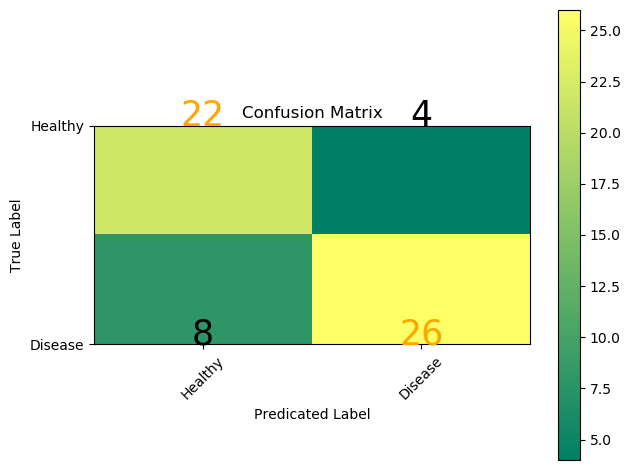

In [52]:
cnf_matrix_plotter(confusion_matrix_model,['Healthy','Disease'])

- ### 4.4 Report scores

In [53]:
report = classification_report(y_test,
                               y_pred,
                               target_names=['Healthy', 'Disease'])
print(report)

              precision    recall  f1-score   support

     Healthy       0.73      0.85      0.79        26
     Disease       0.87      0.76      0.81        34

    accuracy                           0.80        60
   macro avg       0.80      0.81      0.80        60
weighted avg       0.81      0.80      0.80        60



- ### 4.5 ROC and AUC

In [54]:
y_pred_quant = model.predict_proba(X_test)[:,1]

In [55]:
fpr,tpr,thresholds = roc_curve(y_test,y_pred_quant)

In [56]:
fpr

array([0.        , 0.        , 0.        , 0.03846154, 0.03846154,
       0.15384615, 0.15384615, 0.26923077, 0.26923077, 0.30769231,
       0.30769231, 0.42307692, 0.42307692, 0.57692308, 0.57692308,
       0.61538462, 0.61538462, 0.65384615, 0.65384615, 0.73076923,
       0.73076923, 1.        ])

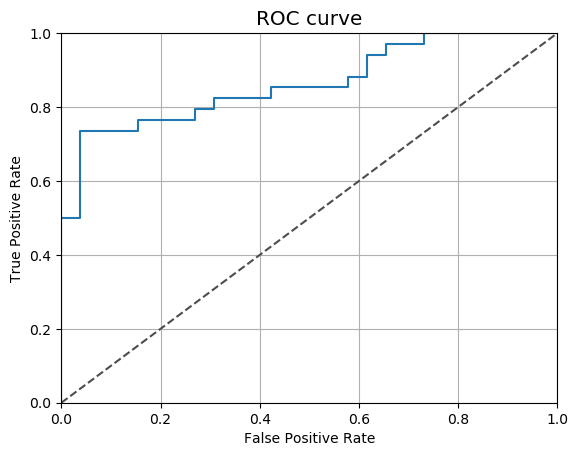

In [57]:
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],ls="--",c=".3")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.rcParams['font.size']=12
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

In [58]:
auc(fpr,tpr)

0.8631221719457014

## 5. Explainable AI

 - ### 5.1 Permutation Importance

In [59]:
perm = PermutationImportance(model,random_state=1).fit(X_test,y_test)
eli5.show_weights(perm,feature_names=X_test.columns.tolist())

Weight,Feature
0.0667 ± 0.0365,thalassemia_normal
0.0300 ± 0.0573,num_major_vessels
0.0300 ± 0.0133,exercise_induced_angina_False
0.0267 ± 0.0452,st_depression
0.0267 ± 0.0340,chest_pain_type_asymptomatic
0.0233 ± 0.0581,exercise_induced_angina_True
0.0167 ± 0.0000,chest_pain_type_typical angina
0.0167 ± 0.0000,sex_Female
0.0133 ± 0.0133,st_slop_upsloping
0.0100 ± 0.0618,age


- ### 5.2 SHAP

In [60]:
y_pred_proba = y_pred_quant

In [61]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

In [62]:
len(shap_values)

2

In [63]:
# 60 samples, 25 features, "no disease" prediction shap values
shap_values[0].shape

(60, 25)

In [64]:
# 60 samples, 25 features, "disease" prediction shap values
shap_values[1].shape

(60, 25)

In [65]:
explainer.expected_value

array([0.55238665, 0.44761335])

In [66]:
explainer.expected_value[0] + explainer.expected_value[1]

0.9999999999999997

## Feature importance
sum up all shap values of one feature, the higher the shap value is, the more important it might be

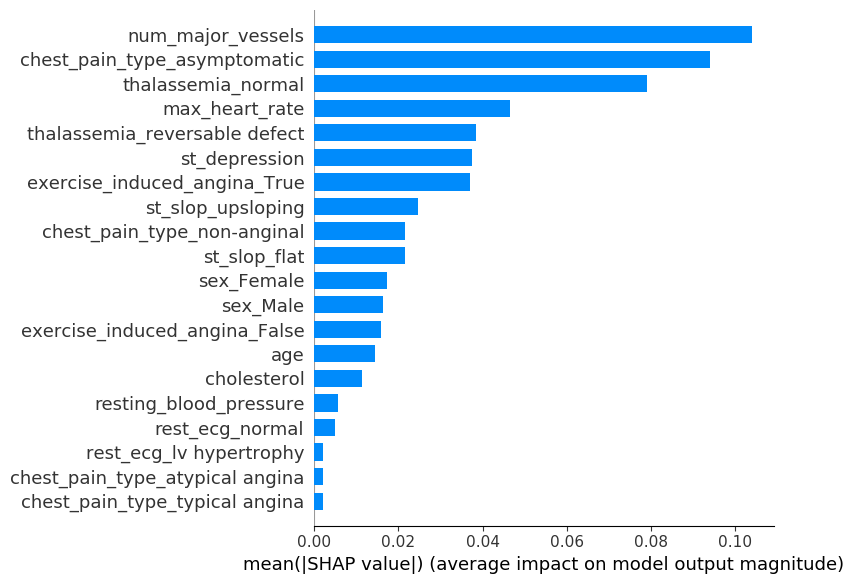

In [67]:
shap.summary_plot(shap_values[1],X_test,plot_type='bar',plot_size=[8,6])

## Correlation between feature values and shap values
Each row represent a feature. red indicate high feature value, and blue indicate low feature value.  
Leaning to the right of the graph means possitive correlation.

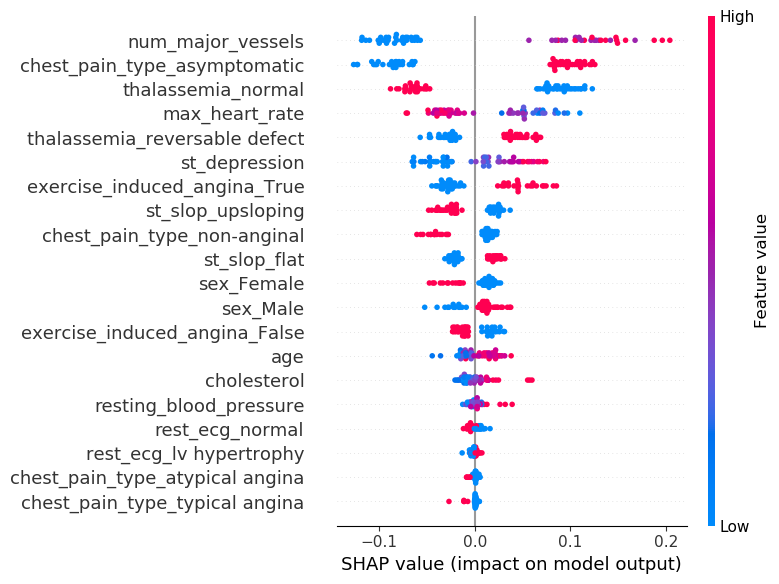

In [68]:
shap.summary_plot(shap_values[1],X_test,plot_size=[8,6])

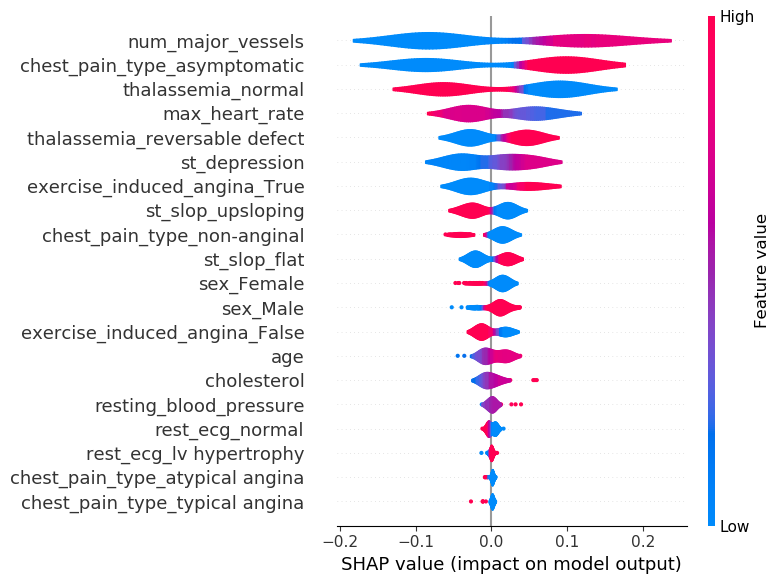

In [69]:
shap.summary_plot(shap_values[1],X_test,plot_type='violin',plot_size=[8,6])

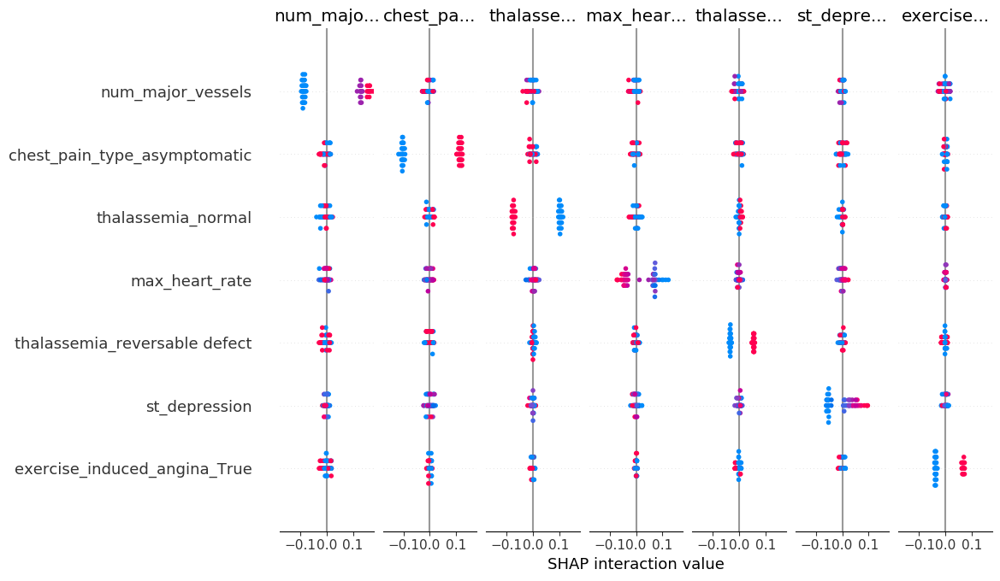

In [70]:
shap_interaction_values = explainer.shap_interaction_values(X_test)
shap.summary_plot(shap_interaction_values[1],X_test,plot_size=[8,6])

In [71]:
idx_random = random.randint(0,X_test.shape[0])
idx_random

20

In [72]:
patient = X_test.iloc[idx_random,:] 
patient_target = y_test.iloc[idx_random] 

In [73]:
patient 

age                                 59.0
resting_blood_pressure             160.0
cholesterol                        273.0
max_heart_rate                     125.0
st_depression                        0.0
num_major_vessels                    0.0
sex_Female                           0.0
sex_Male                             1.0
chest_pain_type_asymptomatic         0.0
chest_pain_type_atypical angina      0.0
chest_pain_type_non-anginal          0.0
chest_pain_type_typical angina       1.0
fasting_blood_sugar_False            1.0
fasting_blood_sugar_True             0.0
rest_ecg_lv hypertrophy              1.0
rest_ecg_normal                      0.0
rest_ecg_st-t abnormality            0.0
exercise_induced_angina_False        1.0
exercise_induced_angina_True         0.0
st_slop_downsloping                  0.0
st_slop_flat                         0.0
st_slop_upsloping                    1.0
thalassemia_fixed defect             0.0
thalassemia_normal                   1.0
thalassemia_reve

In [74]:
patient_target

1

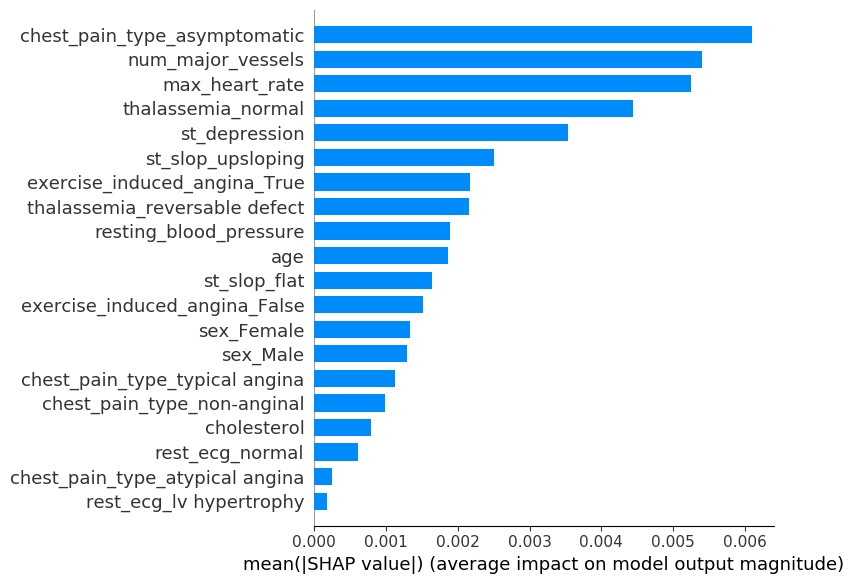

In [75]:
shap.summary_plot(shap_interaction_values[1][idx_random], X_test,plot_type='bar',plot_size=[8,6])

In [76]:
shap_values_patient = explainer.shap_values(patient)

In [77]:
shap_values_patient[0]

array([-0.02177304, -0.00999415, -0.00608213, -0.02815406,  0.04126832,
        0.09495442, -0.01764241, -0.01291145,  0.07567243,  0.00098693,
       -0.01194387,  0.01110132,  0.00019729, -0.00153223, -0.00017955,
       -0.00683426,  0.00017087,  0.01578054,  0.02757048,  0.00043041,
        0.02095971,  0.02098098,  0.0004862 ,  0.07191278,  0.02728851])

In [78]:
shap_values_patient[1]

array([ 0.02177304,  0.00999415,  0.00608213,  0.02815406, -0.04126832,
       -0.09495442,  0.01764241,  0.01291145, -0.07567243, -0.00098693,
        0.01194387, -0.01110132, -0.00019729,  0.00153223,  0.00017955,
        0.00683426, -0.00017087, -0.01578054, -0.02757048, -0.00043041,
       -0.02095971, -0.02098098, -0.0004862 , -0.07191278, -0.02728851])

In [79]:
shap_values_patient[0]+shap_values_patient[1]

array([ 0.00000000e+00, -6.93889390e-18,  8.67361738e-18,  1.38777878e-17,
        3.46944695e-17, -2.77555756e-17,  3.46944695e-18, -1.73472348e-18,
       -1.38777878e-17,  2.16840434e-18,  1.73472348e-18,  0.00000000e+00,
        1.62630326e-19,  8.67361738e-19,  1.62630326e-19,  1.73472348e-18,
       -8.13151629e-20,  3.46944695e-18, -2.08166817e-17, -5.42101086e-20,
       -2.42861287e-17, -3.46944695e-18, -2.71050543e-19, -2.77555756e-17,
        1.04083409e-17])

In [80]:
shap.force_plot(explainer.expected_value[1], shap_values_patient[1], patient)

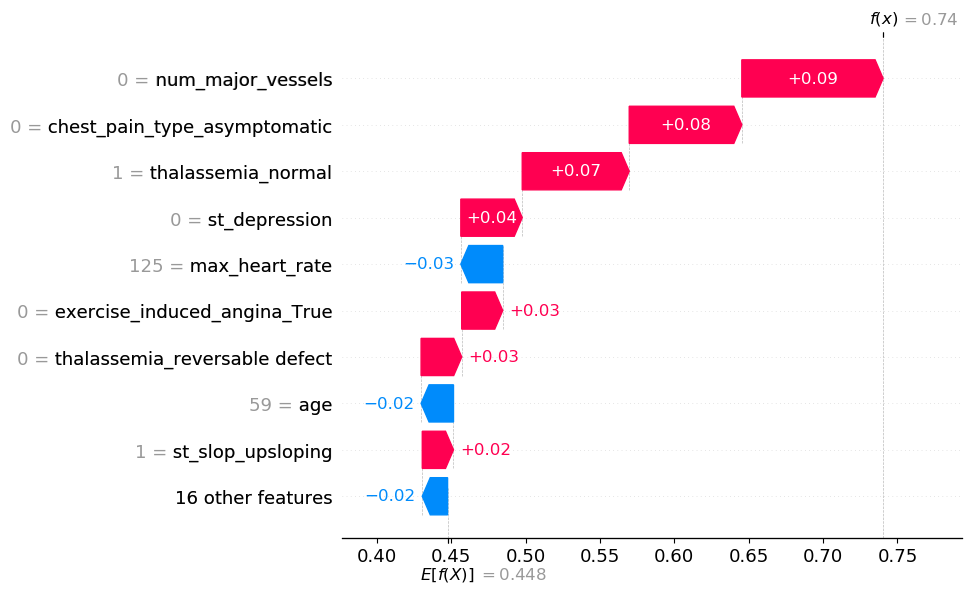

In [81]:
shap.plots._waterfall.waterfall_legacy(explainer.expected_value[1],
                                       shap_values_patient[0],patient)

## summary plot
turn the force plot 90 degree for all samples and piece together

In [82]:
number_show = 60
shap_values_summary = explainer.shap_values(X_train.iloc[:number_show])
shap.force_plot(explainer.expected_value[1], shap_values_summary[1],
                X_test.iloc[:number_show])

## Dependence Plot
shows a feature's shap value change in the feature's value

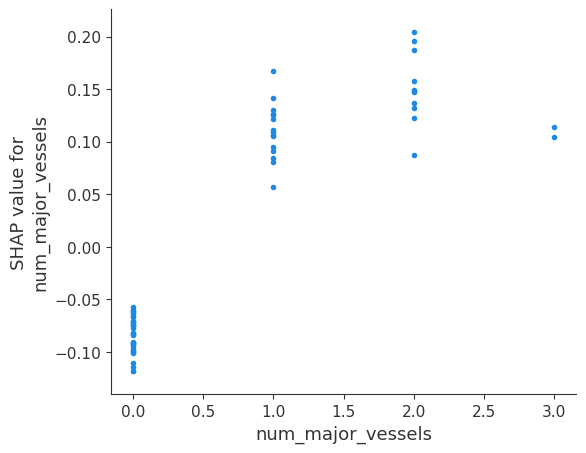

In [83]:
shap.dependence_plot("num_major_vessels",
                     shap_values[1],
                     X_test,
                     interaction_index=None)

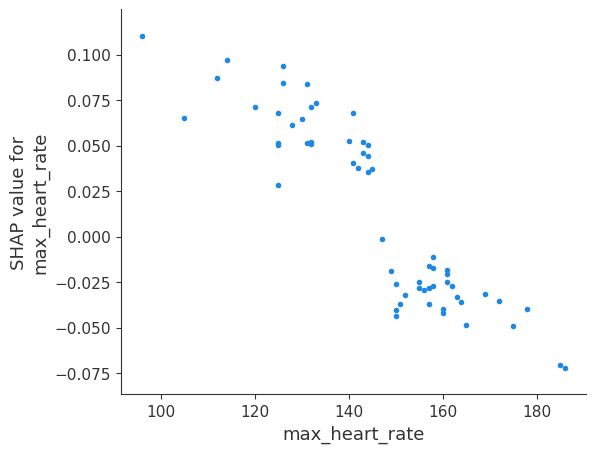

In [84]:
shap.dependence_plot("max_heart_rate",
                     shap_values[1],
                     X_test,
                     interaction_index=None)

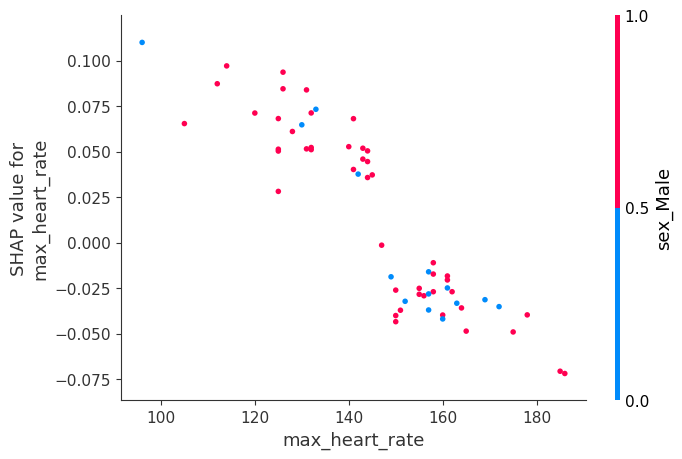

In [85]:
shap.dependence_plot("max_heart_rate",
                     shap_values[1],
                     X_test,
                     interaction_index="sex_Male")

### Partial Dependence Plot

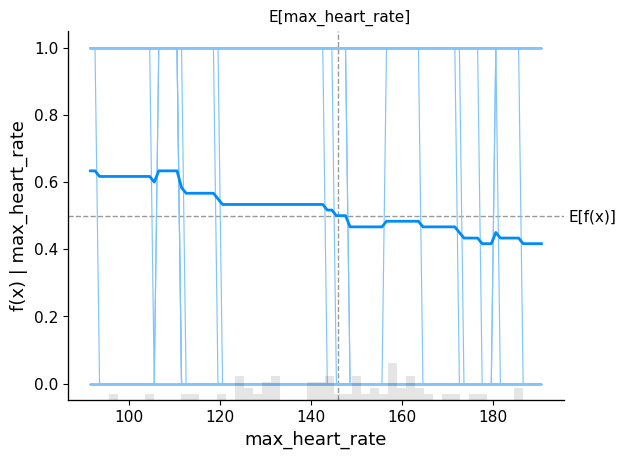

In [86]:
shap.partial_dependence_plot('max_heart_rate',
                             model.predict,
                             X_test,
                             model_expected_value=True,
                             feature_expected_value=True)

### Decision plot

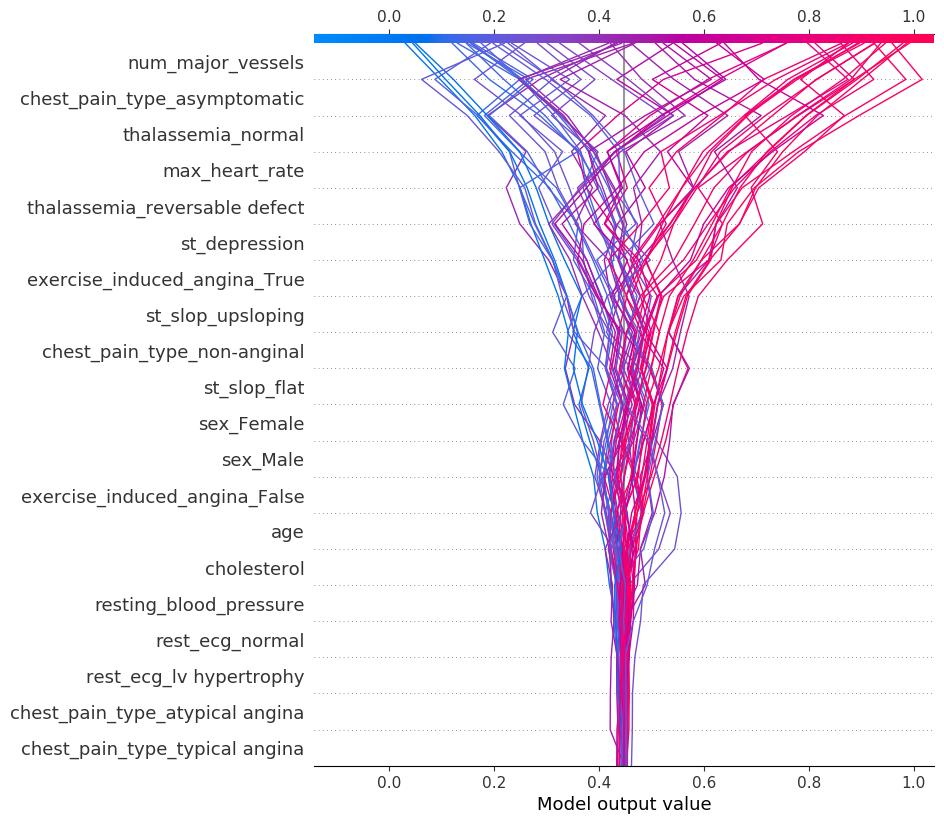

In [87]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value[1],shap_values[1],X_test)

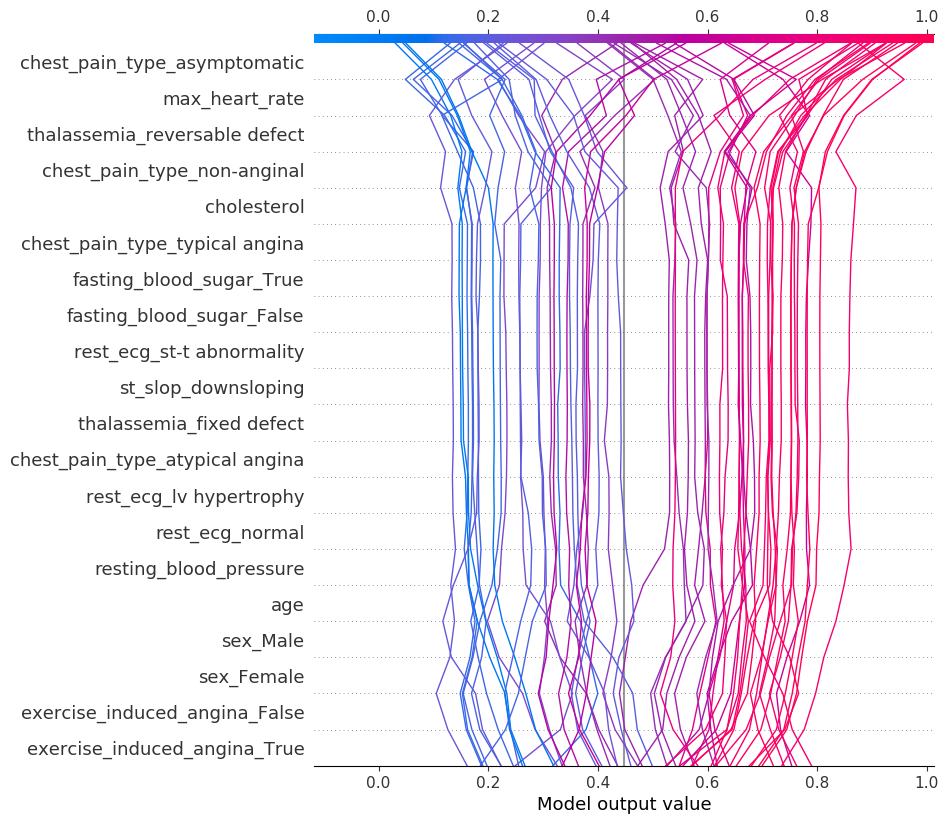

In [88]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value[1],shap_values[1],X_test,feature_order='hclust')

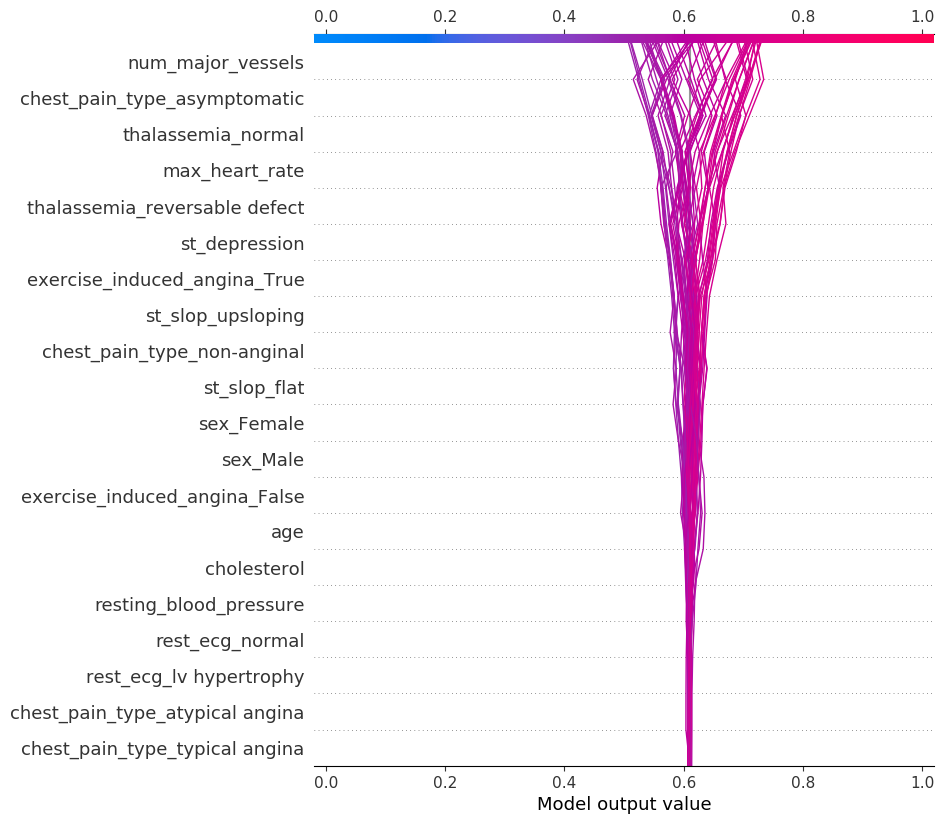

In [89]:
shap.decision_plot(expected_value[1],shap_values[1],X_test,link='logit')

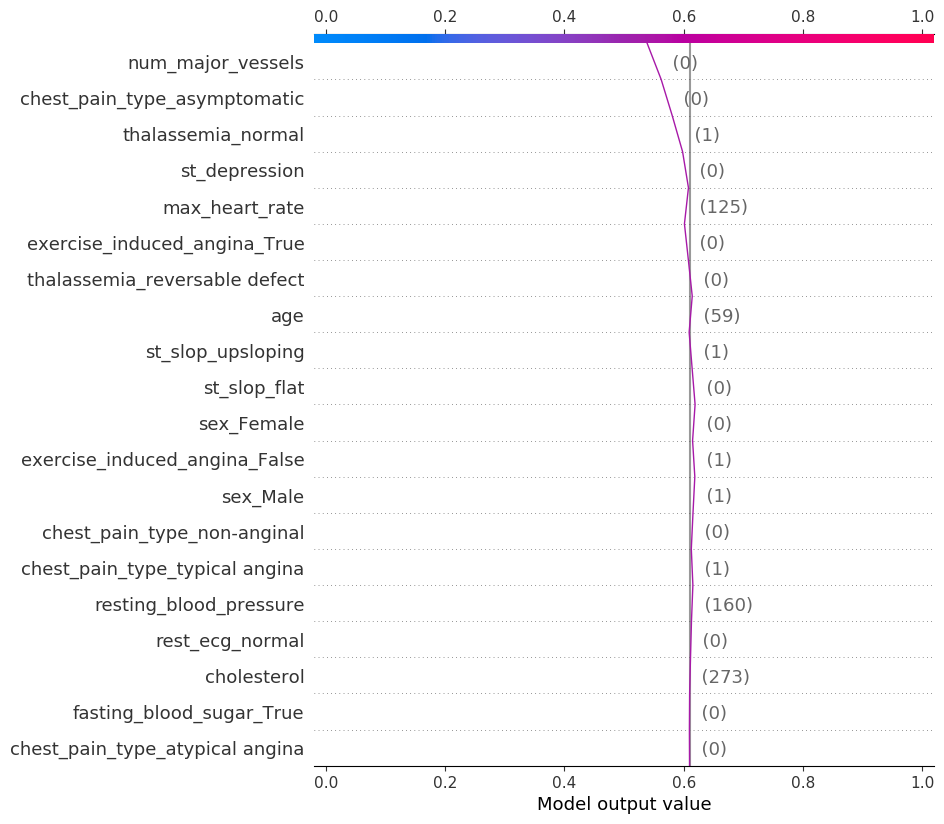

In [90]:
shap.decision_plot(expected_value[1],
                   shap_values_patient[1],
                   patient,
                   link='logit')

## 6.Select misclassified samples

In [91]:
misclassified = y_pred != y_test
misclassified_df = pd.DataFrame({'misclassified': misclassified})

In [92]:
misclassified_df

,misclassified
182,False
120,False
98,False
256,False
17,False
45,False
159,True
100,False
48,False
99,False


In [93]:
misclassified_df.dtypes

misclassified    bool
dtype: object

In [94]:
misclassified_df = misclassified_df[misclassified_df['misclassified']== True]

In [95]:
misclassified_df

,misclassified
159,True
199,True
259,True
107,True
69,True
32,True
204,True
51,True
66,True
250,True


In [96]:
misclassified_index = random.choice(misclassified_df.index.tolist())
misclassified_index

66

In [97]:
misclassified_patient = X.iloc[misclassified_index, :]
misclassified_patient_df = X.loc[misclassified_index:misclassified_index]
model_predict_proba = model.predict_proba(misclassified_patient_df)[0][1]

print('patient {} is taged as {}, model predicted is {:.2f}'.format(
    misclassified_index, bool(y_test[misclassified_index]),
    model_predict_proba))

shap_values_patient = explainer.shap_values(misclassified_patient)
shap.force_plot(explainer.expected_value[1], shap_values_patient[1], patient)

patient 66 is taged as True, model predicted is 0.21


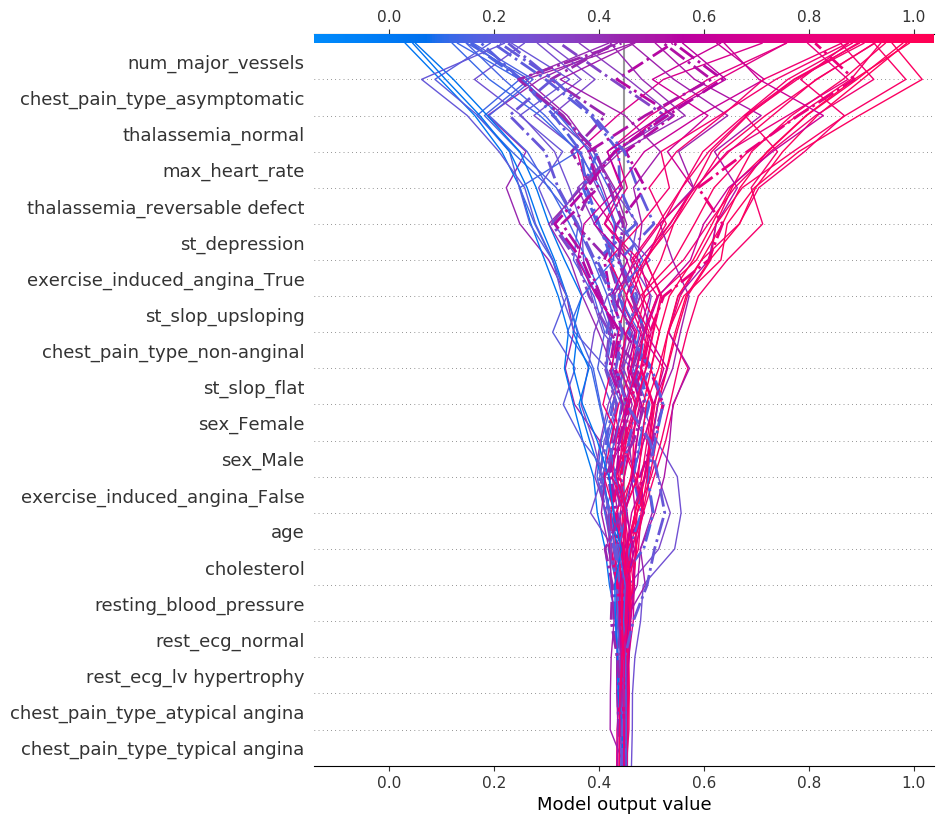

In [98]:
shap.decision_plot(expected_value[1],
                   shap_values[1],
                   X_test,
                   highlight=misclassified)

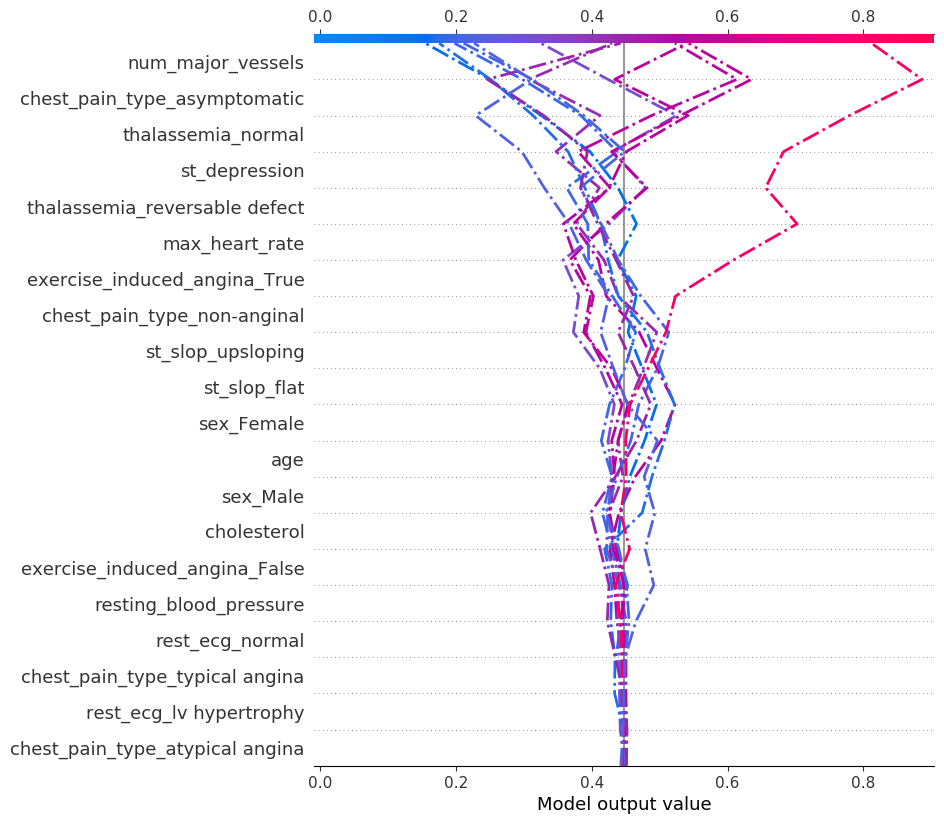

In [99]:
shap.decision_plot(expected_value[1],
                   shap_values[1][misclassified],
                   X_test[misclassified],
                   highlight=range(len(X_test[misclassified])))

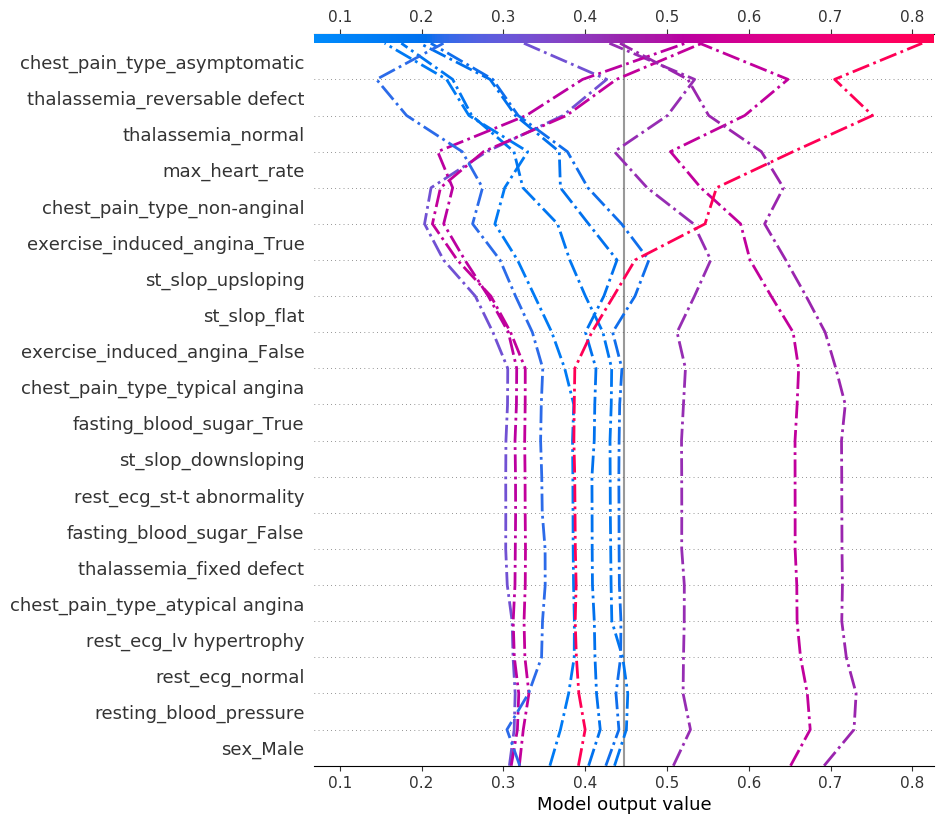

In [100]:
shap.decision_plot(expected_value[1],
                   shap_values[1][misclassified],
                   X_test[misclassified],
                   highlight=range(len(X_test[misclassified])),
                   feature_order='hclust')